# CupIT2023 - DS Ранжирование комментариев - Аналитика

In [1]:
import pandas as pd
import numpy as np
import json
import string 
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.corpus import stopwords as nltk_stopwords
import re

import re
import string
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')
nltk.download('punkt')
stop_words = set(stopwords.words('russian'))
stop_words_eng = set(stopwords.words('english'))
from functools import lru_cache
from nltk.corpus import stopwords

from multiprocessing import Pool
from tqdm import tqdm

import nltk
nltk.download('stopwords')
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk import ngrams

from nltk.tokenize import word_tokenize
from nltk import FreqDist
from pymystem3 import Mystem
#from pymorphy2 import MorphAnalyzer

import re

import plotly.express as px
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

from collections import defaultdict
import plotly.express as px



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


## Чтение данных

In [2]:
#from google.colab import drive
#drive.mount('/content/drive')

Mounted at /content/drive


In [20]:
#df = pd.read_csv('/content/drive/MyDrive/vk/cup_it/dataset_toxic_cos_pn.csv')
df = pd.read_csv('dataset_toxic_cos_pn.csv')

In [4]:
df

,text,comments,score,words_num,mistakes_num,letters_num,stopwords_num,stopwords_percent_num,upper_words_num,unique_num,...,punct_num,first_capital_num,url_num,cos_sim,toxic,insult,obscene,threat,identity_hate,positive
0,How many summer Y Combinator fundees decided n...,Going back to school is not identical with giv...,0,181,0,998,84,46.408840,0,120,...,28,8,0,0.8392,0.001669,0.000226,0.000221,0.000171,0.000161,0.476387
1,How many summer Y Combinator fundees decided n...,There will invariably be those who don't see t...,1,76,1,414,42,55.263158,0,61,...,15,2,0,0.8269,0.000960,0.000193,0.000175,0.000148,0.000138,0.469201
2,How many summer Y Combinator fundees decided n...,For me school is a way to be connected to what...,2,91,0,488,47,51.648352,5,71,...,11,7,0,0.8671,0.000855,0.000190,0.000176,0.000149,0.000145,0.492584
3,How many summer Y Combinator fundees decided n...,I guess it really depends on how hungry you ar...,3,64,1,318,31,48.437500,2,48,...,8,2,0,0.8548,0.000866,0.000189,0.000179,0.000147,0.000138,0.480932
4,How many summer Y Combinator fundees decided n...,I know pollground decided to go back to school...,4,14,2,81,5,35.714286,1,13,...,0,1,0,0.9134,0.000705,0.000177,0.000176,0.000140,0.000124,0.442132
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440530,Pay your rent with a Credit or Debit card. No ...,Most major banks offer a service called &#x27;...,0,73,4,417,38,52.054795,0,54,...,82,2,1,0.8030,0.000909,0.000188,0.000187,0.000141,0.000135,0.477604
440531,Pay your rent with a Credit or Debit card. No ...,"It costs 3.25%, or $74.25 for the example of $...",1,48,3,275,23,47.916667,0,44,...,25,2,0,0.8734,0.002351,0.000255,0.000221,0.000165,0.000142,0.508742
440532,Pay your rent with a Credit or Debit card. No ...,As many other comments have pointed out almost...,2,44,2,245,19,43.181818,0,42,...,5,5,0,0.7524,0.000713,0.000189,0.000176,0.000151,0.000149,0.469829
440533,Pay your rent with a Credit or Debit card. No ...,My apartment building uses Yapstone&#x27;s Ren...,3,31,2,188,11,35.483871,1,30,...,15,2,0,0.8563,0.000806,0.000193,0.000179,0.000146,0.000143,0.501432


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440535 entries, 0 to 440534
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   text                   440535 non-null  object 
 1   comments               440535 non-null  object 
 2   score                  440535 non-null  int64  
 3   words_num              440535 non-null  int64  
 4   mistakes_num           440535 non-null  int64  
 5   letters_num            440535 non-null  int64  
 6   stopwords_num          440535 non-null  int64  
 7   stopwords_percent_num  440535 non-null  float64
 8   upper_words_num        440535 non-null  int64  
 9   unique_num             440535 non-null  int64  
 10  unique_percent_num     440535 non-null  float64
 11  words_mean_len         440535 non-null  float64
 12  punct_num              440535 non-null  int64  
 13  first_capital_num      440535 non-null  int64  
 14  url_num                440535 non-nu

## Разведочный анализ данных (EDA)

Сравним популярные и непопулярные комментарии по разным признакам. Начнем с размера комментариев. 

Text(0.5, 1.0, 'Среднее количество слов')

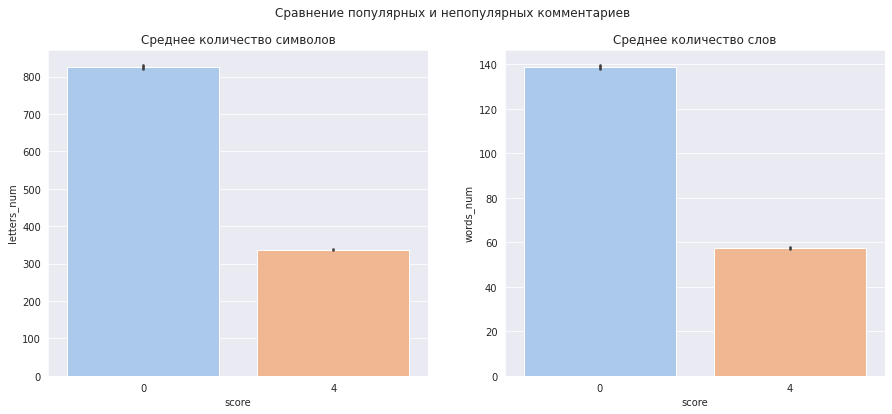

In [6]:
sns.set_style('darkgrid')

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('Сравнение популярных и непопулярных комментариев')

sns.barplot(ax = axes[0], data=df[['letters_num', 'score']].query('score in [0, 4]'), x='score', y="letters_num", 
            palette='pastel').set_title('Среднее количество символов')
sns.barplot(ax = axes[1], data=df[['words_num', 'score']].query('score in [0, 4]'), x='score', y="words_num", 
            palette='pastel').set_title('Среднее количество слов')

В популярных комментариях в среднем слов (и символов) гораздо больше, чем в непопулярных. Можно предположить, что размер комментария влияет на уровень его популярности. Проверим еще среднюю длину слова в комментарии.

In [7]:
print('Медианная средняя длина слова в популярных комментариях:', df[df['score'] == 0]['words_mean_len'].median())
print('Медианная средняя длина слова в непопулярных комментариях',  df[df['score'] == 4]['words_mean_len'].median())

Медианная средняя длина слова в популярных комментариях: 4.950226244343892
Медианная средняя длина слова в непопулярных комментариях 4.878378378378378


Средняя длина слов в зависимости от популярности сильно не меняется. Рассмотрим уникальные используемые слова в комментариях. 

array([<Axes: ylabel='0'>, <Axes: ylabel='4'>], dtype=object)

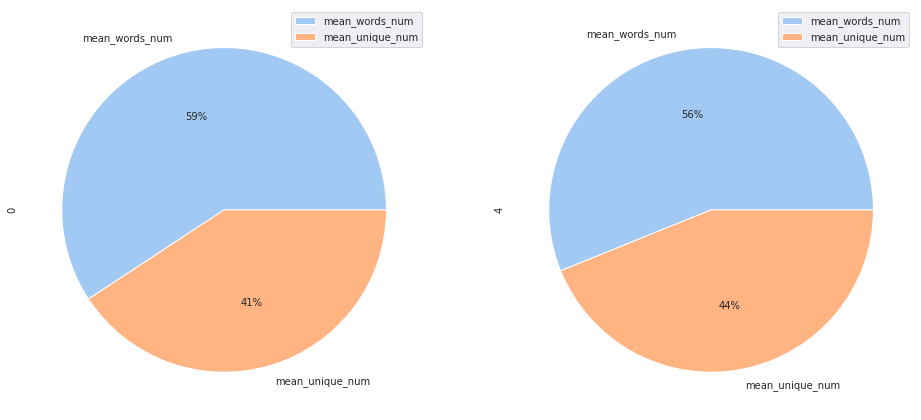

In [8]:
temp_data = {'0':[df[df['score'] == 0]['words_num'].mean(), df[df['score'] == 0]['unique_num'].mean()], 
        '4':[df[df['score'] == 4]['words_num'].mean(), df[df['score'] == 4]['unique_num'].mean()]} 
  
temp = pd.DataFrame(temp_data, index =['mean_words_num', 'mean_unique_num'])

color = sns.color_palette('pastel')

temp.plot(kind='pie', subplots=True, figsize=(16,8), colors=color, autopct='%.0f%%')

В среднем соотношения уникальных слов ко всем словам в зависимости от места комментария в рейтинге почти одинаковые. 

Так как основная часть данных на английском языке, можно предположить, что в текстах много стоп-слов: помимо предлогов, частиц и прочих шумовых слов присутствуют и артикли. Прежде чем очистить данные от них, посмотрим какой процент от среднего размера комментария занимают стоп-слова.  

array([<Axes: ylabel='0'>, <Axes: ylabel='4'>], dtype=object)

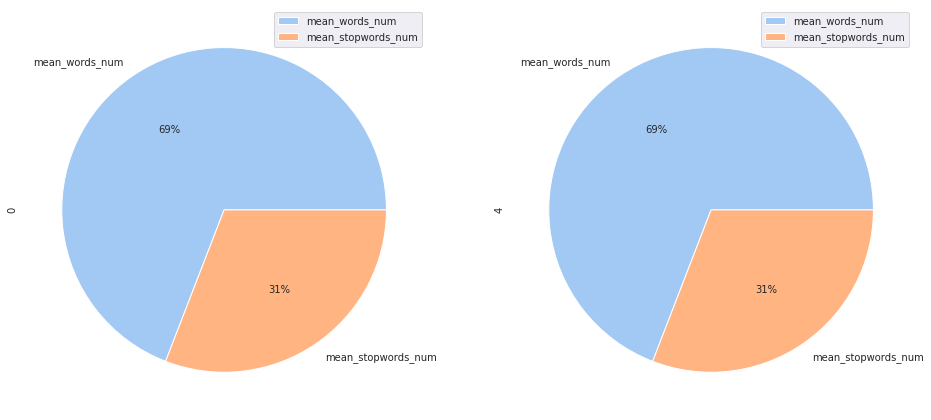

In [9]:
temp_data = {'0':[df[df['score'] == 0]['words_num'].mean(), df[df['score'] == 0]['stopwords_num'].mean()], 
        '4':[df[df['score'] == 4]['words_num'].mean(), df[df['score'] == 4]['stopwords_num'].mean()]} 
  
temp = pd.DataFrame(temp_data, index =['mean_words_num', 'mean_stopwords_num'])

temp.plot(kind='pie', subplots=True, figsize=(16,8), colors=color, autopct='%.0f%%')

В комментариях иногда встречаются ссылки, посмотрим на распределение классов в зависимости от количества ссылок в комментарии

<Axes: xlabel='url_num', ylabel='Count'>

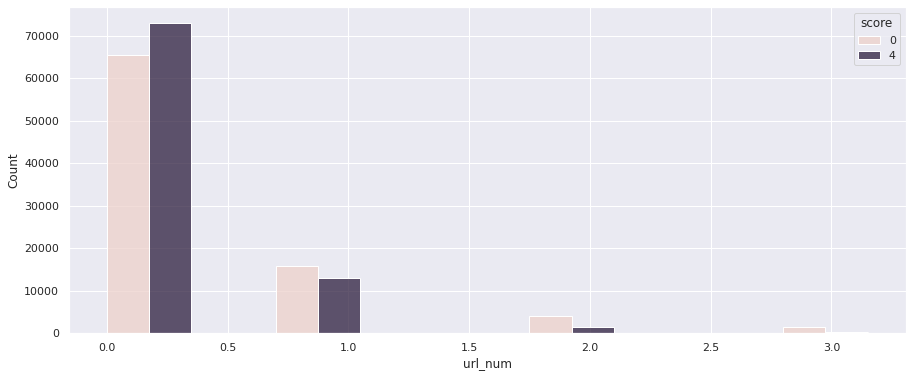

In [10]:
data =  df[['url_num', 'score']].query('score in [0, 4] and url_num < 4')
sns.set(rc={'figure.figsize':(15, 6)})
sns.histplot(data=data, x="url_num", hue='score',  multiple='dodge', binwidth = 0.35)

Среди комментариев, в которых встречаются ссылки, больше тех, что являются популярными, и хотя разница не слишком большая, можно предположить, что в какой-то степени наличие ссылки на внешний источник может влиять на популярность комментария. 

### Boxplots

Посмотрим, насколько в наших данных часто встречаются аномальные значения

In [22]:
fig = px.box(df, x="score", y="words_num")
fig.show()

In [28]:
fig = px.box(df, y="mistakes_num")
fig.show()

In [24]:
fig = px.box(df, x="score", y="words_mean_len")
fig.show()

In [25]:
fig = px.box(df, x="score", y="cos_sim")
fig.show()

В целом, аномалии встречаются, но, поскольку они встречаются и в тестовом датасете и в принципе в комментариях, было принято решение от них датасет не чистить

## Обработка текстовых данных

Лемматизация и очистка для аналитики других фичей

In [6]:
m = WordNetLemmatizer()
regex = re.compile("[А-Яа-яA-z]+")

def words_only(text, regex=regex):
    try:
        return regex.findall(text.lower())
    except:
        return []

@lru_cache(maxsize=128)
def lemmatize_word(token, pymorphy=m):
    return m.lemmatize(token)

def lemmatize_text(text):
    return [lemmatize_word(w) for w in text]


mystopwords = stopwords.words('english') 
def remove_stopwords(lemmas, stopwords = mystopwords):
    return [w for w in lemmas if not w in stopwords and len(w) > 3]

def clean_text(text):
    tokens = words_only(text)
    lemmas = lemmatize_text(tokens)
    
    return ' '.join(remove_stopwords(lemmas))

In [7]:
with Pool(4) as p:
    lemmas = list(tqdm(p.imap(clean_text, df['comments']), total=len(df)))
    
df['lemmas'] = lemmas
df.sample(5)

100%|██████████| 440535/440535 [06:01<00:00, 1220.04it/s]


,text,comments,score,words_num,mistakes_num,letters_num,stopwords_num,stopwords_percent_num,upper_words_num,unique_num,...,first_capital_num,url_num,cos_sim,toxic,insult,obscene,threat,identity_hate,positive,lemmas
192334,YaCy takes on Google with open source search e...,I'm sure a lot of people are interested in the...,4,51,1,369,20,39.215686,1,43,...,3,2,0.8827,0.000711,0.000181,0.000176,0.000143,0.000133,0.483202,sure people interested implementation detail y...
246641,The Future is not Real-Time,Read the blog post that this post links to fir...,1,123,0,632,67,54.471545,1,89,...,10,0,0.8117,0.001201,0.000208,0.000195,0.000150,0.000149,0.483664,read blog post post link first depth like idea...
218624,The Real Cost of Used Games,There are not even any numbers in the article....,4,79,0,431,39,49.367089,1,67,...,6,0,0.8897,0.001096,0.000196,0.000192,0.000149,0.000143,0.476116,even number article percentage game bought use...
251195,DIY quest for a 6 watt high-end desktop computer,This guy should totally go work in Google's pl...,0,176,6,956,77,43.750000,4,134,...,9,0,0.8476,0.001440,0.000219,0.000214,0.000160,0.000151,0.498497,totally work google platform power group would...
129360,Facebook is what happens to the Web when you h...,A mail system that doesn’t have a Bcc function...,0,191,8,1057,90,47.120419,6,138,...,20,0,0.8575,0.001756,0.000227,0.000227,0.000174,0.000161,0.489991,mail system function belong century reminds co...


In [13]:
def cr(x):
    return ' '.join(x)

In [14]:
df_lemm = df[['lemmas']]

In [15]:
df_lemm = df_lemm.apply(cr, axis=0)

In [16]:
all_text_tokens = word_tokenize(df_lemm['lemmas'])
all_text = nltk.Text(all_text_tokens)
fdist_all = FreqDist(all_text)
fdist_all_most_c = fdist_all.most_common(50)
fdist_all_most_c

[('like', 158586),
 ('http', 133711),
 ('quot', 129111),
 ('people', 127657),
 ('would', 126492),
 ('time', 104873),
 ('make', 91639),
 ('thing', 90718),
 ('think', 88668),
 ('work', 88571),
 ('really', 79135),
 ('good', 74597),
 ('much', 68974),
 ('even', 67207),
 ('also', 66263),
 ('want', 65480),
 ('know', 64824),
 ('need', 62611),
 ('year', 62182),
 ('could', 62091),
 ('something', 61344),
 ('company', 54387),
 ('problem', 50940),
 ('well', 49058),
 ('many', 47061),
 ('google', 44505),
 ('going', 44185),
 ('code', 43705),
 ('article', 43424),
 ('first', 43280),
 ('user', 43088),
 ('better', 43016),
 ('take', 42891),
 ('idea', 42849),
 ('look', 42640),
 ('still', 41988),
 ('using', 41531),
 ('great', 40741),
 ('point', 39701),
 ('find', 38469),
 ('site', 38185),
 ('right', 37640),
 ('actually', 36302),
 ('system', 35892),
 ('seems', 34669),
 ('data', 34571),
 ('might', 34074),
 ('project', 33349),
 ('business', 33334),
 ('someone', 33016)]

In [17]:
values = [pair[1] for pair in fdist_all_most_c]
labels = [pair[0] for pair in fdist_all_most_c]
fig = px.line(fdist_all_most_c, x=labels, y=values, title="Топ 50 частотных слов корпуса") 
fig.show()

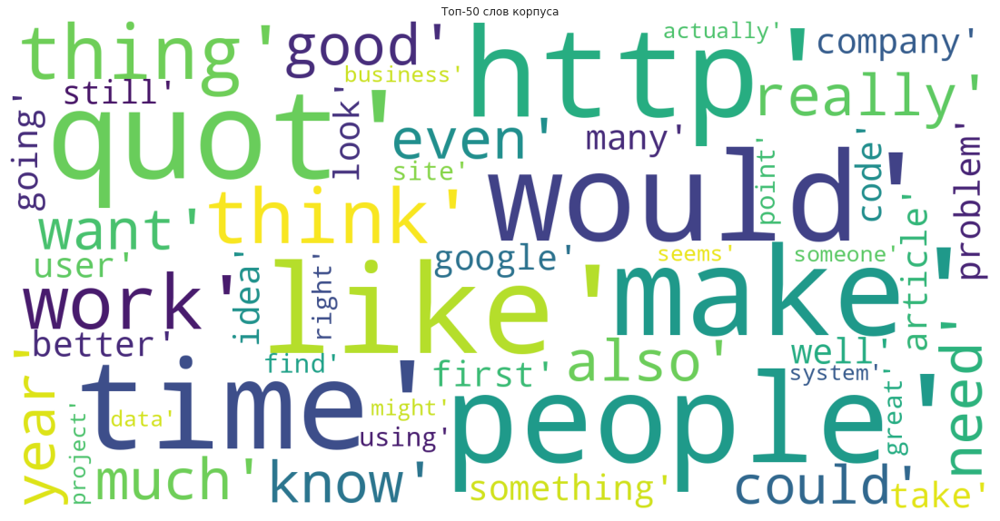

In [18]:
# Создаем текст для облака частотных слова
text_wordcloud= ' '.join(map(str, fdist_all_most_c)) 
wordcloud = WordCloud(width=1600, height=800, max_font_size=200, max_words=100,background_color="white", collocations=True).generate(text_wordcloud)

# Визуализация 
plt.figure(figsize=(20,10))
plt.imshow(wordcloud)
plt.title('Топ-50 слов корпуса')
plt.axis("off")
plt.show()

Посмотрим на самые частотные слова популярных и непопулярных комментариев

In [11]:
df_0 = df.query('score == 0')

In [12]:
df_4 = df.query('score == 4')

In [21]:
df_lemm0 = df_0[['lemmas']]
df_lemm0 = df_lemm0.apply(cr, axis=0)
text_tokens0 = word_tokenize(df_lemm0['lemmas'])
text0 = nltk.Text(text_tokens0)
fdist_0 = FreqDist(text0)
fdist_0_most_c = fdist_0.most_common(50)
fdist_0_most_c

[('like', 47515),
 ('quot', 42247),
 ('people', 41468),
 ('http', 38677),
 ('would', 36988),
 ('time', 33557),
 ('make', 29006),
 ('thing', 28666),
 ('work', 27596),
 ('think', 26238),
 ('really', 23683),
 ('good', 22150),
 ('even', 21964),
 ('much', 21391),
 ('want', 21036),
 ('also', 20457),
 ('year', 20041),
 ('need', 19706),
 ('know', 19617),
 ('could', 18916),
 ('something', 18741),
 ('company', 17497),
 ('problem', 16639),
 ('many', 15283),
 ('well', 15045),
 ('first', 14151),
 ('code', 14105),
 ('going', 14104),
 ('user', 13859),
 ('take', 13635),
 ('google', 13473),
 ('better', 13289),
 ('point', 12863),
 ('still', 12690),
 ('idea', 12573),
 ('article', 12553),
 ('using', 12474),
 ('look', 12372),
 ('system', 12217),
 ('right', 12039),
 ('find', 11765),
 ('actually', 11754),
 ('site', 11556),
 ('great', 11298),
 ('data', 11036),
 ('might', 10617),
 ('money', 10518),
 ('business', 10469),
 ('back', 10380),
 ('project', 10157)]

In [22]:
values = [pair[1] for pair in fdist_0_most_c]
labels = [pair[0] for pair in fdist_0_most_c]
fig = px.line(fdist_0_most_c, x=labels, y=values, title="Топ 50 частотных слов корпуса") 
fig.show()

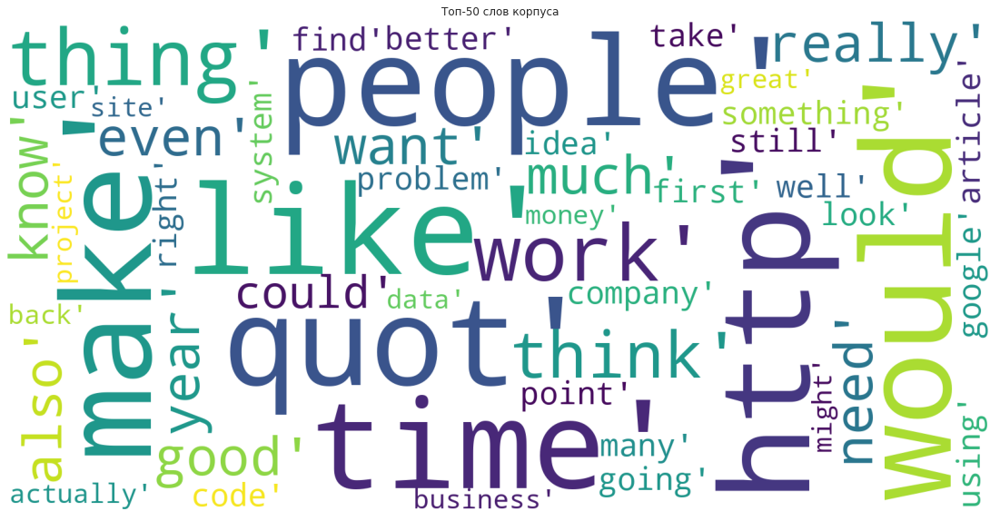

In [23]:
# Создаем текст для облака частотных слова
text_wordcloud= ' '.join(map(str, fdist_0_most_c)) 
wordcloud = WordCloud(width=1600, height=800, max_font_size=200, max_words=100,background_color="white", collocations=True).generate(text_wordcloud)

# Визуализация 
plt.figure(figsize=(20,10))
plt.imshow(wordcloud)
plt.title('Топ-50 слов корпуса')
plt.axis("off")
plt.show()

In [24]:
df_lemm4 = df_4[['lemmas']]
df_lemm4 = df_lemm4.apply(cr, axis=0)
text_tokens4 = word_tokenize(df_lemm4['lemmas'])
text4 = nltk.Text(text_tokens4)
fdist_4 = FreqDist(text4)
fdist_4_most_c = fdist_4.most_common(30)
fdist_4_most_c

[('like', 22477),
 ('http', 18600),
 ('would', 18169),
 ('quot', 16657),
 ('people', 16492),
 ('time', 13738),
 ('think', 12489),
 ('work', 12088),
 ('make', 12028),
 ('thing', 11863),
 ('really', 11150),
 ('good', 10688),
 ('much', 9246),
 ('know', 8989),
 ('also', 8916),
 ('could', 8811),
 ('even', 8661),
 ('something', 8564),
 ('want', 8506),
 ('need', 8287),
 ('year', 8038),
 ('company', 7199),
 ('well', 6656),
 ('problem', 6524),
 ('article', 6381),
 ('google', 6312),
 ('great', 6221),
 ('look', 6157),
 ('many', 6013),
 ('still', 5969)]

In [25]:
values = [pair[1] for pair in fdist_4_most_c]
labels = [pair[0] for pair in fdist_4_most_c]
fig = px.line(fdist_4_most_c, x=labels, y=values, title="Топ 50 частотных слов корпуса") 
fig.show()

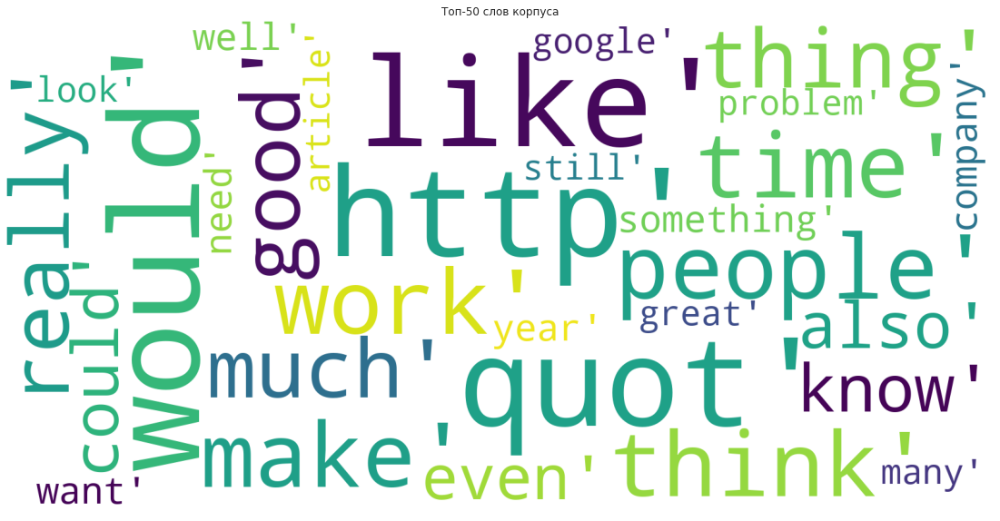

In [26]:
# Создаем текст для облака частотных слова
text_wordcloud= ' '.join(map(str, fdist_4_most_c)) 
wordcloud = WordCloud(width=1600, height=800, max_font_size=200, max_words=100,background_color="white", collocations=True).generate(text_wordcloud)

# Визуализация 
plt.figure(figsize=(20,10))
plt.imshow(wordcloud)
plt.title('Топ-50 слов корпуса')
plt.axis("off")
plt.show()

Самые частотные слова для популярных и непопулярных комментариев почти не отличаются

### 3-grammes

In [8]:
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

In [9]:
N = 20

In [13]:
less_toxic_trigrams = defaultdict(int)
for tweet in df_0['lemmas']:
    for word in generate_ngrams(tweet, 3):
        less_toxic_trigrams[word] += 1
        
df_less_toxic_trigrams = pd.DataFrame(sorted(less_toxic_trigrams.items(), key=lambda x: x[1])[::-1])

trigrams_less_100 = df_less_toxic_trigrams[:N]

more_toxic_trigrams = defaultdict(int)
for tweet in df_4['lemmas']:
    for word in generate_ngrams(tweet, 3):
        more_toxic_trigrams[word] += 1
        
df_more_toxic_trigrams = pd.DataFrame(sorted(more_toxic_trigrams.items(), key=lambda x: x[1])[::-1])

trigrams_more_100 = df_more_toxic_trigrams[:N]

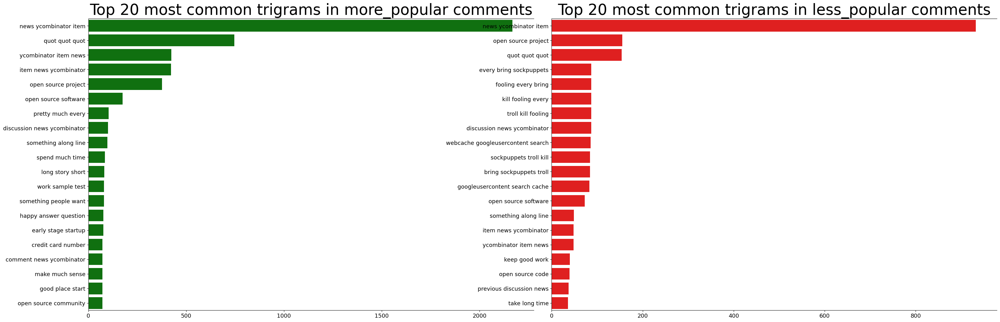

In [29]:
fig, axes = plt.subplots(ncols=2, figsize=(30, N//2), dpi=100)
plt.tight_layout()

sns.barplot(y=trigrams_less_100[0], x=trigrams_less_100[1], ax=axes[0], color='green')
sns.barplot(y=trigrams_more_100[0], x=trigrams_more_100[1], ax=axes[1], color='red')

for i in range(2):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=13)
    axes[i].tick_params(axis='y', labelsize=13)

axes[0].set_title(f'Top {N} most common trigrams in more_popular comments', fontsize=35)
axes[1].set_title(f'Top {N} most common trigrams in less_popular comments', fontsize=35)

plt.show()

Триграммы тоже ничего интересного не дали

## Heatmap

In [39]:
num_features = df[['score', 'words_num', 'mistakes_num', 'letters_num',
       'stopwords_num', 'stopwords_percent_num', 'upper_words_num',
       'unique_num', 'unique_percent_num', 'words_mean_len', 'punct_num',
       'first_capital_num', 'url_num', 'cos_sim', 'toxic', 'insult', 'obscene',
       'threat', 'identity_hate', 'positive']]

<Axes: >

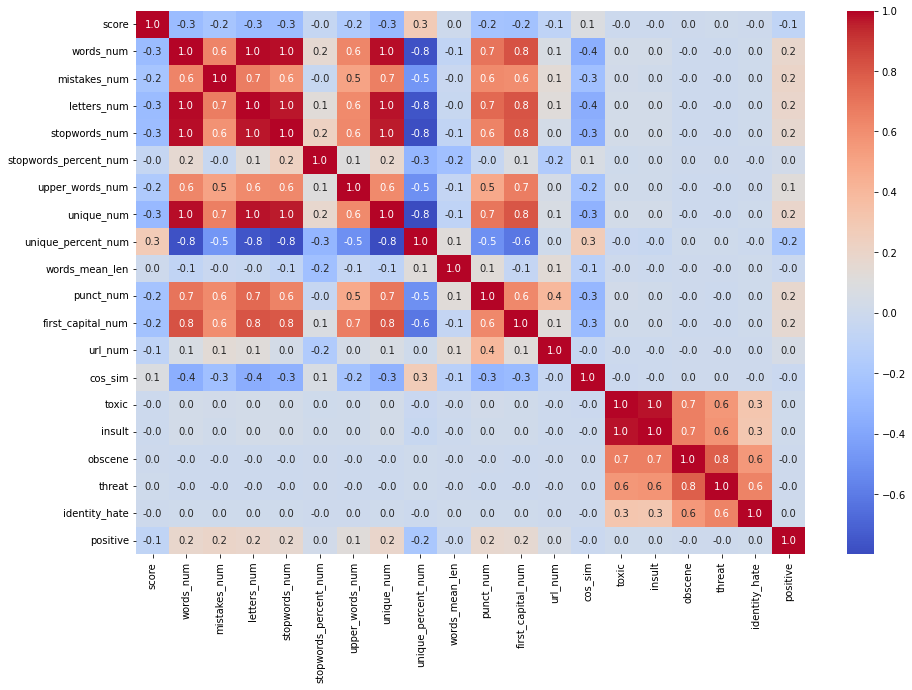

In [40]:
fig, ax = plt.subplots(figsize=(15,10)) 
sns.heatmap(data=num_features.corr(), annot=True, fmt=".1f", cmap="coolwarm")

На тепловой карте видна матрица корреляций признаков

## Токсичность и позитивность/негативность

In [35]:
df[['score', 'toxic', 'insult', 'obscene',
       'threat', 'identity_hate', 'positive']]\
        .groupby('score', as_index=False).agg('mean')

,score,toxic,insult,obscene,threat,identity_hate,positive
0,0,0.015839,0.011712,0.001517,0.000478,0.000205,0.482266
1,1,0.014773,0.010779,0.001499,0.000477,0.000196,0.481176
2,2,0.014472,0.010568,0.001557,0.000497,0.000197,0.480577
3,3,0.013210,0.009206,0.001512,0.000518,0.000197,0.480127
4,4,0.013343,0.009298,0.001594,0.000520,0.000191,0.479576


In [36]:
temp = df[['score', 'toxic', 'insult', 'obscene',
       'threat', 'identity_hate', 'positive']]\
        .groupby('score', as_index=False).agg('mean')

Text(0.5, 1.0, 'Positive mean values')

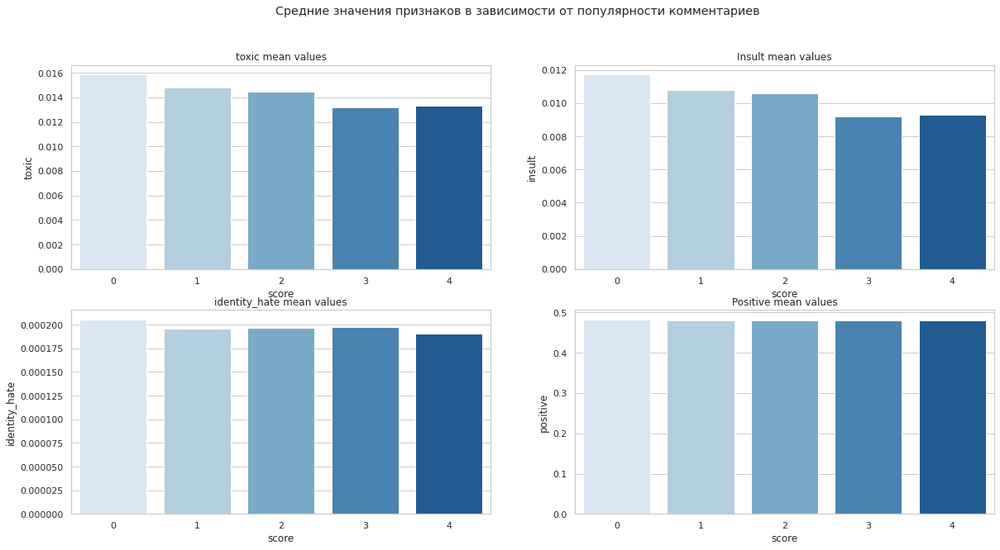

In [37]:
sns.set_style("whitegrid")
sns.set_palette('Blues')

fig, axes = plt.subplots(2, 2, figsize=(20, 10))
fig.suptitle('Средние значения признаков в зависимости от популярности комментариев')

sns.barplot(ax = axes[0][0], data=temp[['toxic', 'score']], x='score', y="toxic", 
            palette='Blues').set_title('toxic mean values')
sns.barplot(ax = axes[0][1], data=temp[['insult', 'score']], x='score', y="insult", 
            palette='Blues').set_title('Insult mean values')
sns.barplot(ax = axes[1][0], data=temp[['identity_hate', 'score']], x='score', y="identity_hate", 
            palette='Blues').set_title('identity_hate mean values')
sns.barplot(ax = axes[1][1], data=temp[['positive', 'score']], x='score', y="positive", 
            palette='Blues').set_title('Positive mean values')

В целом, модель дает либо слишком "грубые" предсказания, поэтому модели не очень применимы к нашим данным:

## Удаление ненужных колонок

В результате анализа мы решили удалить часть столбцов, как наименее значимые для скора

In [38]:
df = df.drop(['toxic', 'insult', 'obscene', 'threat', 'identity_hate', 'lemmas'], axis=1)

In [39]:
df

,text,comments,score,words_num,mistakes_num,letters_num,stopwords_num,stopwords_percent_num,upper_words_num,unique_num,unique_percent_num,words_mean_len,punct_num,first_capital_num,url_num,cos_sim,positive
0,How many summer Y Combinator fundees decided n...,Going back to school is not identical with giv...,0,181,0,998,84,46.408840,0,120,66.298343,4.491713,28,8,0,0.8392,0.476387
1,How many summer Y Combinator fundees decided n...,There will invariably be those who don't see t...,1,76,1,414,42,55.263158,0,61,80.263158,4.460526,15,2,0,0.8269,0.469201
2,How many summer Y Combinator fundees decided n...,For me school is a way to be connected to what...,2,91,0,488,47,51.648352,5,71,78.021978,4.373626,11,7,0,0.8671,0.492584
3,How many summer Y Combinator fundees decided n...,I guess it really depends on how hungry you ar...,3,64,1,318,31,48.437500,2,48,75.000000,3.968750,8,2,0,0.8548,0.480932
4,How many summer Y Combinator fundees decided n...,I know pollground decided to go back to school...,4,14,2,81,5,35.714286,1,13,92.857143,4.857143,0,1,0,0.9134,0.442132
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440530,Pay your rent with a Credit or Debit card. No ...,Most major banks offer a service called &#x27;...,0,73,4,417,38,52.054795,0,54,73.972603,8.082192,82,2,1,0.8030,0.477604
440531,Pay your rent with a Credit or Debit card. No ...,"It costs 3.25%, or $74.25 for the example of $...",1,48,3,275,23,47.916667,0,44,91.666667,5.062500,25,2,0,0.8734,0.508742
440532,Pay your rent with a Credit or Debit card. No ...,As many other comments have pointed out almost...,2,44,2,245,19,43.181818,0,42,95.454545,4.545455,5,5,0,0.7524,0.469829
440533,Pay your rent with a Credit or Debit card. No ...,My apartment building uses Yapstone&#x27;s Ren...,3,31,2,188,11,35.483871,1,30,96.774194,5.580645,15,2,0,0.8563,0.501432


## Сохранение результата

In [41]:
df.to_csv('final_features.csv', index=False)

In [44]:
#!cp 'final_features.csv' '/content/drive/MyDrive/vk/cup_it/'